In [63]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

df= pd.read_csv("diabetic_data.csv")
df.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      101766 non-null  object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    101766 non-null  object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                101766 non-null  object
 11  medical_specialty         101766 non-null  object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

In [3]:
for x in df.columns:
    col = df[x]
    unique = col.unique()
    print(f"\nData Column : {x} \nUnique Values : {unique}")


Data Column : encounter_id 
Unique Values : [  2278392    149190     64410 ... 443854148 443857166 443867222]

Data Column : patient_nbr 
Unique Values : [  8222157  55629189  86047875 ... 140199494 120975314 175429310]

Data Column : race 
Unique Values : ['Caucasian' 'AfricanAmerican' '?' 'Other' 'Asian' 'Hispanic']

Data Column : gender 
Unique Values : ['Female' 'Male' 'Unknown/Invalid']

Data Column : age 
Unique Values : ['[0-10)' '[10-20)' '[20-30)' '[30-40)' '[40-50)' '[50-60)' '[60-70)'
 '[70-80)' '[80-90)' '[90-100)']

Data Column : weight 
Unique Values : ['?' '[75-100)' '[50-75)' '[0-25)' '[100-125)' '[25-50)' '[125-150)'
 '[175-200)' '[150-175)' '>200']

Data Column : admission_type_id 
Unique Values : [6 1 2 3 4 5 8 7]

Data Column : discharge_disposition_id 
Unique Values : [25  1  3  6  2  5 11  7 10  4 14 18  8 13 12 16 17 22 23  9 20 15 24 28
 19 27]

Data Column : admission_source_id 
Unique Values : [ 1  7  2  4  5  6 20  3 17  8  9 14 10 22 11 25 13]

Data Column 

In [4]:
(df == '?').sum()

encounter_id                    0
patient_nbr                     0
race                         2273
gender                          0
age                             0
weight                      98569
admission_type_id               0
discharge_disposition_id        0
admission_source_id             0
time_in_hospital                0
payer_code                  40256
medical_specialty           49949
num_lab_procedures              0
num_procedures                  0
num_medications                 0
number_outpatient               0
number_emergency                0
number_inpatient                0
diag_1                         21
diag_2                        358
diag_3                       1423
number_diagnoses                0
max_glu_serum                   0
A1Cresult                       0
metformin                       0
repaglinide                     0
nateglinide                     0
chlorpropamide                  0
glimepiride                     0
acetohexamide 

In [5]:
df.replace('?', pd.NA, inplace=True)
df.isna().sum()

encounter_id                    0
patient_nbr                     0
race                         2273
gender                          0
age                             0
weight                      98569
admission_type_id               0
discharge_disposition_id        0
admission_source_id             0
time_in_hospital                0
payer_code                  40256
medical_specialty           49949
num_lab_procedures              0
num_procedures                  0
num_medications                 0
number_outpatient               0
number_emergency                0
number_inpatient                0
diag_1                         21
diag_2                        358
diag_3                       1423
number_diagnoses                0
max_glu_serum               96420
A1Cresult                   84748
metformin                       0
repaglinide                     0
nateglinide                     0
chlorpropamide                  0
glimepiride                     0
acetohexamide 

In [ ]:
df = df.drop(columns=['encounter_id','patient_nbr','race','weight','admission_source_id',
                    'payer_code','medical_specialty','gender','age','diag_1','diag_2','diag_3',
                    'acetohexamide','tolbutamide','troglitazone','examide','citoglipton',
                    'glipizide-metformin','glimepiride-pioglitazone','metformin-rosiglitazone','metformin-pioglitazone'])

In [8]:
from sklearn.impute import SimpleImputer

cols_to_impute = ['race']
df[cols_to_impute] = df[cols_to_impute].astype(str)
imputer = SimpleImputer(strategy='most_frequent')
df[cols_to_impute] = imputer.fit_transform(df[cols_to_impute])

In [9]:
df.isna().sum()

patient_nbr                 0
race                        0
gender                      0
age                         0
admission_type_id           0
discharge_disposition_id    0
time_in_hospital            0
num_lab_procedures          0
num_procedures              0
num_medications             0
number_outpatient           0
number_emergency            0
number_inpatient            0
number_diagnoses            0
metformin                   0
repaglinide                 0
nateglinide                 0
chlorpropamide              0
glimepiride                 0
glipizide                   0
glyburide                   0
pioglitazone                0
rosiglitazone               0
acarbose                    0
miglitol                    0
tolazamide                  0
insulin                     0
glyburide-metformin         0
change                      0
diabetesMed                 0
readmitted                  0
dtype: int64

In [10]:
df.duplicated().sum()

0

In [11]:
df.dtypes

patient_nbr                  int64
race                        object
gender                      object
age                         object
admission_type_id            int64
discharge_disposition_id     int64
time_in_hospital             int64
num_lab_procedures           int64
num_procedures               int64
num_medications              int64
number_outpatient            int64
number_emergency             int64
number_inpatient             int64
number_diagnoses             int64
metformin                   object
repaglinide                 object
nateglinide                 object
chlorpropamide              object
glimepiride                 object
glipizide                   object
glyburide                   object
pioglitazone                object
rosiglitazone               object
acarbose                    object
miglitol                    object
tolazamide                  object
insulin                     object
glyburide-metformin         object
change              

In [12]:
numeric_cols = [
    'time_in_hospital', 'num_lab_procedures', 'num_procedures',
    'num_medications', 'number_outpatient', 'number_emergency',
    'number_inpatient', 'number_diagnoses'
]

for col in numeric_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

print("Dataset shape after removing outliers:", df.shape)

Dataset shape after removing outliers: (66592, 31)


In [13]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df[numeric_cols] = scaler.fit_transform(df[numeric_cols])

print(df[numeric_cols].head())

   time_in_hospital  num_lab_procedures  num_procedures  num_medications  \
1          0.181818            0.610526             0.0         0.548387   
3          0.090909            0.452632             0.2         0.483871   
4          0.000000            0.526316             0.0         0.225806   
6          0.272727            0.726316             0.2         0.645161   
7          0.363636            0.757895             0.0         0.354839   

   number_outpatient  number_emergency  number_inpatient  number_diagnoses  
1                0.0               0.0               0.0          0.636364  
3                0.0               0.0               0.0          0.454545  
4                0.0               0.0               0.0          0.272727  
6                0.0               0.0               0.0          0.454545  
7                0.0               0.0               0.0          0.545455  


In [14]:
df.head()

,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,...,pioglitazone,rosiglitazone,acarbose,miglitol,tolazamide,insulin,glyburide-metformin,change,diabetesMed,readmitted
1,55629189,Caucasian,Female,[10-20),1,1,0.181818,0.610526,0.0,0.548387,...,No,No,No,No,No,Up,No,Ch,Yes,>30
3,82442376,Caucasian,Male,[30-40),1,1,0.090909,0.452632,0.2,0.483871,...,No,No,No,No,No,Up,No,Ch,Yes,NO
4,42519267,Caucasian,Male,[40-50),1,1,0.000000,0.526316,0.0,0.225806,...,No,No,No,No,No,Steady,No,Ch,Yes,NO
6,84259809,Caucasian,Male,[60-70),3,1,0.272727,0.726316,0.2,0.645161,...,No,No,No,No,No,Steady,No,Ch,Yes,NO
7,114882984,Caucasian,Male,[70-80),1,1,0.363636,0.757895,0.0,0.354839,...,No,No,No,No,No,No,No,No,Yes,>30


In [15]:
categorical_cols = [
    'race', 'gender', 'age', 'admission_type_id',
    'discharge_disposition_id', 'metformin', 'glipizide',
    'glyburide', 'insulin', 'change', 'diabetesMed',
    'readmitted'
]

for col in categorical_cols:
    if col in df.columns:
        df[col] = df[col].astype('category')


print(df.dtypes[categorical_cols])

race                        category
gender                      category
age                         category
admission_type_id           category
discharge_disposition_id    category
metformin                   category
glipizide                   category
glyburide                   category
insulin                     category
change                      category
diabetesMed                 category
readmitted                  category
dtype: object


In [16]:
for col in df.select_dtypes(include='category').columns:
    df[col] = df[col].astype(str).str.upper()

df['readmitted'] = df['readmitted'].replace({
    '>30': 'READMITTED_LATE',
    '<30': 'READMITTED_SOON',
    'NO': 'NOT_READMITTED'
})

print("Readmitted values:", df['readmitted'].unique())

Readmitted values: ['READMITTED_LATE' 'NOT_READMITTED' 'READMITTED_SOON']


In [31]:
import cufflinks as cf
import plotly.offline as pyo
import plotly.express as px

grouped = df.groupby('time_in_hospital')['num_medications'].mean().reset_index()
fig = px.line(grouped, x='time_in_hospital', y='num_medications',
              title='Average Number of Medications by Time in Hospital',
              labels={'time_in_hospital': 'Time in Hospital (days)', 'num_medications': 'Average Medications'})
fig.show()

In [18]:
age_counts = df['age'].value_counts().sort_index()
age_df = age_counts.reset_index()
age_df.columns = ['age_group', 'count']

fig = px.area(age_df, x='age_group', y='count',
              title='Patient Age Distribution',
              labels={'age_group': 'Age Group', 'count': 'Number of Patients'})
fig.show()

In [32]:
fig = px.histogram(df, x='num_lab_procedures',
                   title='Distribution of Number of Lab Procedures',
                   labels={'num_lab_procedures': 'Number of Lab Procedures'})
fig.show()


In [ ]:
df = df[df['race'] != '<NA>']

In [30]:
race_counts = df['race'].value_counts().reset_index()
race_counts.columns = ['race', 'count']

fig = px.bar(race_counts, x='race', y='count',
             title='Patient Count by Race',
             labels={'count': 'Number of Patients', 'race': 'Race'})
fig.show()


In [33]:
gender_counts = df['gender'].value_counts().reset_index()
gender_counts.columns = ['gender', 'count']

fig = px.pie(gender_counts, names='gender', values='count',
             title='Gender Distribution')
fig.show()


In [34]:
fig = px.box(df, x='age', y='num_medications',
             title='Number of Medications by Age Group',
             labels={'age': 'Age Group', 'num_medications': 'Number of Medications'})
fig.show()


In [ ]:
fig = px.scatter(df, x='number_diagnoses', y='num_medications',
                 size='time_in_hospital', color='age',
                 title='Diagnoses vs. Medications (Bubble Size = Time in Hospital)',
                 labels={'number_diagnoses': 'Number of Diagnoses',
                         'num_medications': 'Number of Medications',
                         'time_in_hospital': 'Time in Hospital'})
fig.show()

# Feature Engineering

In [66]:
for x in df.columns:
    df[x] = df[x].replace({"Steady":0,"No":0,"Up":1,"Down":1,"Ch":1,"Yes":1,">30":0,"<30":1,np.nan:0,"Norm":0,">300":1,">200":1,">7":1,">8":1,"NO":0})

In [35]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
for col in ['gender', 'diabetesMed', 'change', 'readmitted','race',
            'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride',
            'pioglitazone','rosiglitazone','acarbose','miglitol','tolazamide',
            'metformin', 'glyburide', 'insulin', 'glipizide']:
    df[col] = le.fit_transform(df[col])


In [38]:
med_cols = [
    'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride',
    'glipizide', 'glyburide', 'pioglitazone', 'rosiglitazone', 'acarbose',
    'miglitol', 'tolazamide', 'insulin', 'glyburide-metformin'
]

# Map usage: 'No' = 0, others = 1
df['meds_count'] = df[med_cols].apply(lambda x: sum(x != 'No'), axis=1)

In [39]:
# Chronic condition indicator (more than 8 diagnoses)
df['many_diagnoses'] = (df['number_diagnoses'] > 8).astype(int)

In [40]:
# Severity proxy — long stay or many meds/labs
df['high_severity'] = ((df['time_in_hospital'] > 7) | (df['num_medications'] > 30) | (df['num_lab_procedures'] > 80)).astype(int)

In [41]:
df['age'] = df['age'].str.extract(r'(\d+)').astype(int) + 5

In [42]:
df['total_visits'] = df['number_outpatient'] + df['number_emergency'] + df['number_inpatient']

In [43]:
df['proc_time_interaction'] = df['num_procedures'] * df['time_in_hospital']
df['age_diagnoses_interaction'] = df['age'] * df['number_diagnoses']

In [44]:
df['readmitted'].value_counts()

readmitted
0    38040
1    20576
2     6225
Name: count, dtype: int64

# Feature selection

In [48]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel

X = df.drop(columns=['patient_nbr', 'readmitted'])
y = df['readmitted']

model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X, y)

selector = SelectFromModel(model, prefit=True)
X_selected = selector.transform(X)

selected_features = X.columns[selector.get_support()]
print(selected_features)

Index(['race', 'age', 'admission_type_id', 'discharge_disposition_id',
       'time_in_hospital', 'num_lab_procedures', 'num_procedures',
       'num_medications', 'number_diagnoses', 'insulin',
       'proc_time_interaction', 'age_diagnoses_interaction'],
      dtype='object')


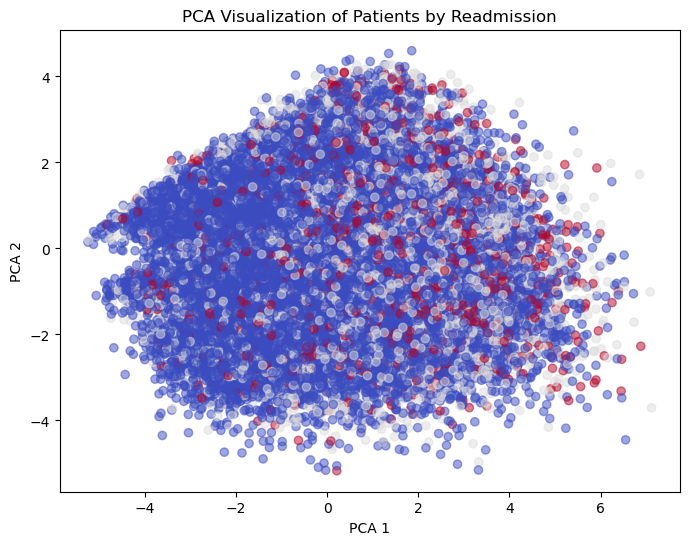

In [49]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)


plt.figure(figsize=(8,6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap='coolwarm', alpha=0.5)
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.title('PCA Visualization of Patients by Readmission')
plt.show()

- PCA does not capture meaningful variance that distinguishes readmission outcomes.

- Readmission prediction may rely on non-linear interactions or higher-dimensional features.

# Modeling

In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

xgb_model = XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    eval_metric='mlogloss',
    use_label_encoder=False,
    random_state=42
)
xgb_model.fit(X_train, y_train)

y_pred = xgb_model.predict(X_test)

print(f"Accuracy: {accuracy_score(y_test, y_pred) * 100:.2f}%\n")
print("Classification Report:")
print(classification_report(y_test, y_pred))


Accuracy: 60.09%

Classification Report:
              precision    recall  f1-score   support

           0       0.63      0.89      0.74      7643
           1       0.47      0.24      0.32      4057
           2       0.39      0.03      0.05      1269

    accuracy                           0.60     12969
   macro avg       0.50      0.39      0.37     12969
weighted avg       0.55      0.60      0.54     12969



In [ ]:
x1 = df.drop(columns='readmitted')
y1 = df.readmitted

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

ros = RandomOverSampler()
rus = RandomUnderSampler()
x,y = ros.fit_resample(x1,y1)

In [ ]:
if df.shape[1] > 100000:
    x,y = rus.fit_resample(x,y)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import VotingClassifier,GradientBoostingClassifier,RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline as pipeline
from sklearn.preprocessing import PolynomialFeatures

x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.1,random_state=42)

model3 = pipeline(steps=[('poly_features',PolynomialFeatures(degree=2)),
                         ('ensemble',VotingClassifier(estimators=[('LR',LogisticRegression()),
                                                                  ('RFC',RandomForestClassifier()),
                                                                  ('GBC',GradientBoostingClassifier())],voting='hard'))])

model3.fit(x_train,y_train)

Pipeline(steps=[('poly_features', PolynomialFeatures()),
                ('ensemble',
                 VotingClassifier(estimators=[('LR', LogisticRegression()),
                                              ('RFC', RandomForestClassifier()),
                                              ('GBC',
                                               GradientBoostingClassifier())]))])

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

predicts = model3.predict(x_test)

print("Accuracy:")
print(accuracy_score(y_test,predicts))
print("\nClassification Report:")
print(classification_report(y_test,predicts))

Accuracy:
0.7068355270434686

Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.77      0.72      8979
           1       0.74      0.64      0.69      9103

    accuracy                           0.71     18082
   macro avg       0.71      0.71      0.71     18082
weighted avg       0.71      0.71      0.71     18082

